In [1]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans 
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt

In [2]:
data = pd.read_excel('sampled_5per_data.xlsx')
data = data.drop(data.columns[0], axis=1)
data.head()

,Age_Group,Gender,Race,Type_Of_Admission,Diagnosis_Description,Procedure_Description,APR_DRG_Description,APR_MDC_Description,APR_Severity_Of_Illness_Description,APR_Risk_Of_Mortality,APR_Medical_Surgical_Description,Payment_Typology_1,Is_Emergency_Department_Indicator,Length_Of_Stay,LOS_Discrete
0,70 or Older,F,White,Emergency,"STRESS FRACTURE, INITIAL ENCOUNTER",BONE FIXATION (EXCLUDING EXTREMITIES),CERVICAL SPINAL FUSION AND OTHER BACK OR NECK ...,DISEASES AND DISORDERS OF THE MUSCULOSKELETAL ...,Minor,Minor,Surgical,Blue Cross/Blue Shield,True,1,1
1,50 to 69,F,Other Race,Elective,OTHER SPECIFIED AND UNSPECIFIED CIRCULATORY DI...,LIGATION AND EMBOLIZATION OF VESSELS,EXTENSIVE O.R. PROCEDURE UNRELATED TO PRINCIPA...,DISEASES AND DISORDERS OF THE CIRCULATORY SYSTEM,Moderate,Minor,Surgical,Medicaid,False,1,1
2,50 to 69,F,White,Elective,OBESITY,DIAPHRAGMATIC HERNIA REPAIR,PROCEDURES FOR OBESITY,"ENDOCRINE, NUTRITIONAL AND METABOLIC DISEASES ...",Minor,Minor,Surgical,Blue Cross/Blue Shield,False,1,1
3,70 or Older,F,White,Elective,OSTEOARTHRITIS,ARTHROPLASTY OF OTHER JOINT (EXCLUDING KNEE AN...,SHOULDER AND ELBOW JOINT REPLACEMENT,DISEASES AND DISORDERS OF THE MUSCULOSKELETAL ...,Minor,Minor,Surgical,Medicare,False,1,1
4,50 to 69,F,White,Emergency,HYPERTENSION WITH COMPLICATIONS AND SECONDARY ...,ISOLATION PROCEDURES,HYPERTENSION,DISEASES AND DISORDERS OF THE CIRCULATORY SYSTEM,Minor,Minor,Medical,Medicare,True,1,1


In [5]:
num_clusters = 7
init_method = 'k-means++'
features = ['Age_Group',
  'Gender',
  'Race',
  'Type_Of_Admission',
  'Payment_Typology_1',
  'Is_Emergency_Department_Indicator',
  'APR_Risk_Of_Mortality']

In [6]:
data_used = data[features]
data_encode = pd.get_dummies(data,drop_first=True)
data_encode = data_encode.astype(int)
X = data_encode.values

In [7]:
#define pairwise distance function
def pairwise_dist(x, y):
    x_sq = np.sum(x**2, axis=1, keepdims=True)
    y_sq = np.sum(y**2, axis=1, keepdims=True)
    xy = np.dot(x, y.T)
    distances = np.sqrt(x_sq + y_sq.T - 2 * xy)
    return distances

In [73]:
# np.random.seed(13)

# if init_method == 'random':
#     indicies = np.random.choice(X.shape[0], num_clusters, replace=False)
#     centers=X[indicies]

# else:   
#     num_sample = int(0.01 * X.shape[0])
#     sampled_points = X[np.random.choice(X.shape[0], num_sample, replace=False)]

#     first_center_index = np.random.choice(sampled_points.shape[0])
#     centers = [sampled_points[first_center_index]]

#     for k in range(2, num_clusters+1):

#         min_distances = np.zeros(sampled_points.shape[0])

#         for i, point in enumerate(sampled_points):
#             distances = [np.sum((point - center)**2) for center in centers]
#             min_distances[i] = min(distances)

#         max_distance_index = np.argmax(min_distances)

#         centers.append(sampled_points[max_distance_index])

#     centers=np.array(centers)

# assignments = np.zeros(X.shape[0]) - 1

# it = 0
# prev_loss = float('inf')
# while it < 300:
#     distances = pairwise_dist(X, centers)
#     assignments = np.argmin(distances, axis=1)

#     unique_elements = np.unique(assignments,axis=0)
#     new_centers = np.array([np.average(X[assignments == a],axis=0) for a in unique_elements])
#     centers = new_centers

#     if len(centers) < num_clusters:
#         new_cluster_num = num_clusters - len(centers)

#         add_center = X[np.random.choice(X.shape[0], new_cluster_num, replace=False)]

#         centers = np.concatenate((centers,add_center),axis=0)

#     distances = pairwise_dist(X, centers)
#     assignments = np.argmin(distances, axis=1)

#     unique_elements = np.unique(assignments,axis=0)
#     new_centers = np.array([np.average(X[assignments == a],axis=0) for a in unique_elements])
#     centers = new_centers

#     dist = pairwise_dist(X, centers)
#     sq_dist = dist**2
#     extract = sq_dist[np.arange(X.shape[0]),assignments]
#     new_loss = np.sum(extract)

#     if prev_loss-new_loss == 0:
#         break

#     prev_loss = new_loss
#     it += 1

# labels=assignments
# print(labels)

[3 3 3 ... 2 2 2]


In [6]:
kmeans = KMeans(n_clusters=num_clusters,
                init=init_method,
                random_state=13,
                max_iter = 300)
kmeans.fit(X)

labels = kmeans.labels_
print(labels)

C:\Users\cozmemis3\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


[0 0 0 ... 6 6 6]


In [9]:
np.where(labels==3)

(array([36033, 36034, 36035, 36036, 36037, 36038, 36039, 36040, 36041,
        36042, 36043, 36044, 36045, 36046, 36047, 36048, 36049, 36050,
        36051, 36052, 36053, 36054, 36055, 36056, 36057, 36058, 36059,
        36060, 36061, 36062, 36063, 36064, 36065, 36066, 36067, 36068,
        36069, 36070, 36071, 36072, 36073, 36074, 36075, 36076, 36077,
        36078, 36079, 36080, 36081, 36082, 36083, 36084, 36085, 36086,
        36087, 36088, 36089, 36090, 36091, 36092, 36093, 36094, 36095,
        36096, 36097, 36098, 36099, 36100, 36101, 36102, 36103, 36104,
        36105, 36106, 36107, 36108, 36109, 36110, 36111, 36112, 36113,
        36114, 36115, 36116, 36117, 36118, 36119, 36120, 36121, 36122,
        36123, 36124, 36125, 36126, 36127, 36128, 36129, 36130, 36131,
        36132, 36133, 36134, 36135, 36136, 36137, 36138, 36139, 36140,
        36141, 36142, 36143, 36144, 36145, 36146, 36147, 36148, 36149,
        36150, 36151, 36152, 36153, 36154, 36155, 36156, 36157, 36158,
      

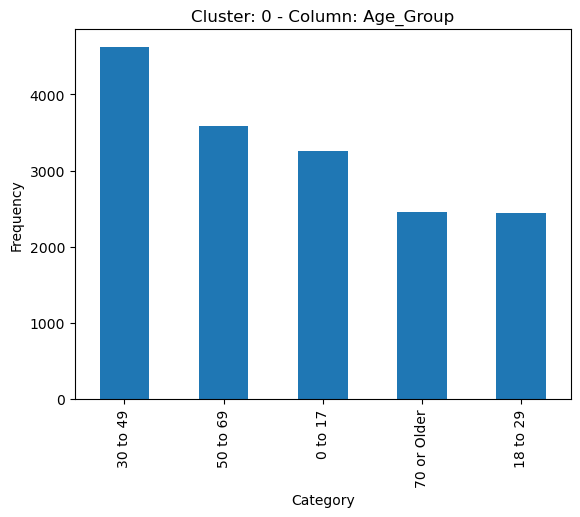

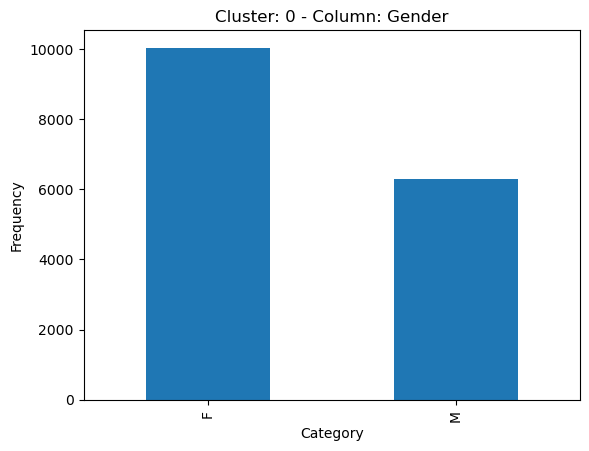

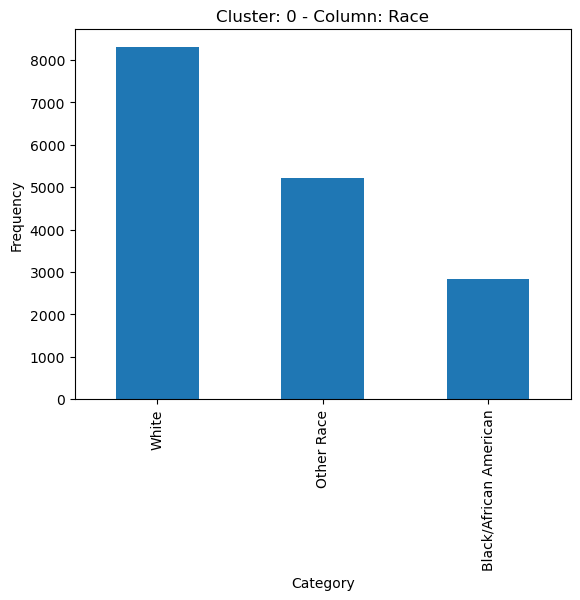

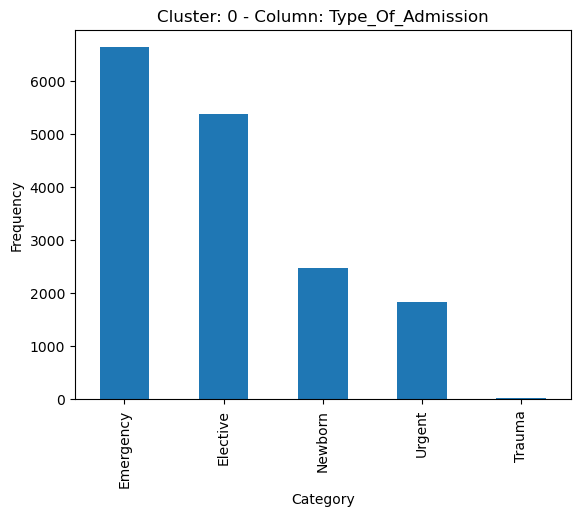

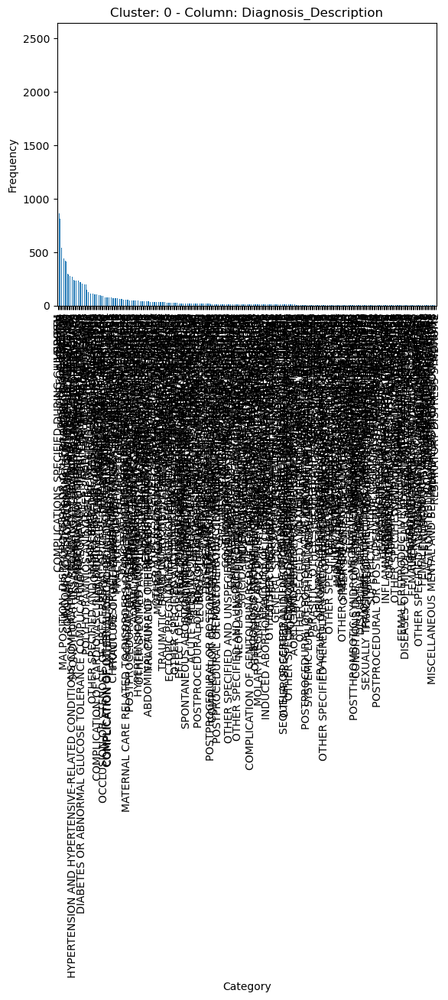

...

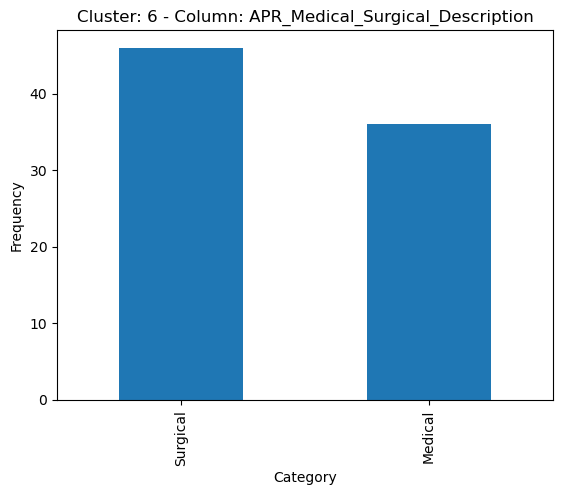

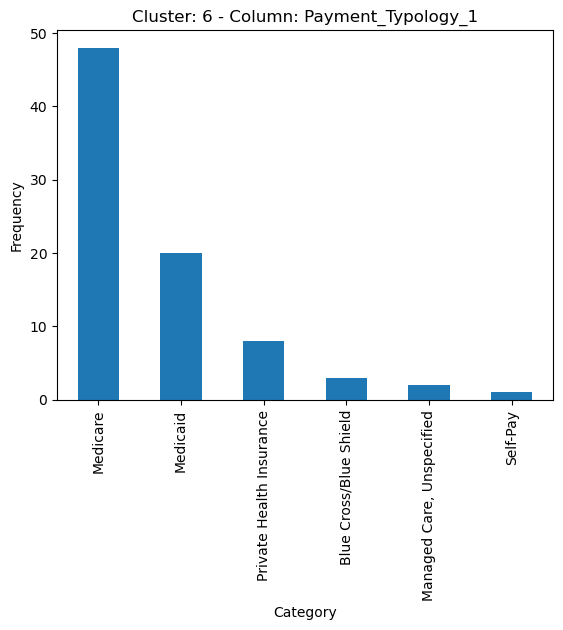

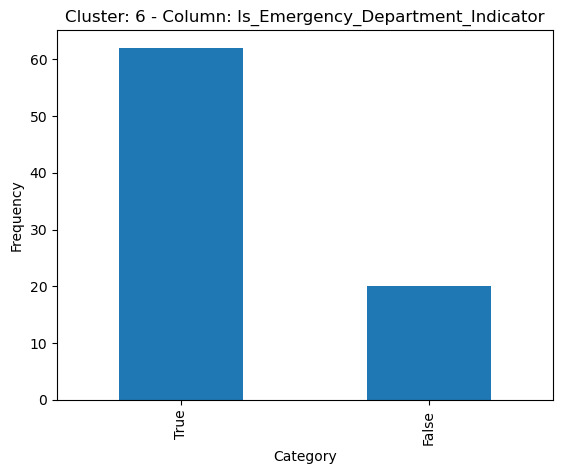

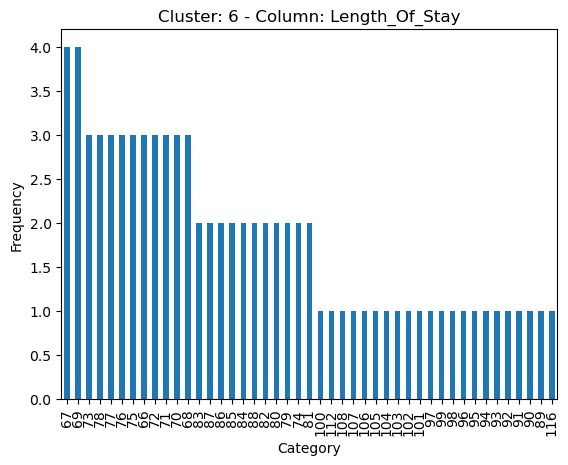

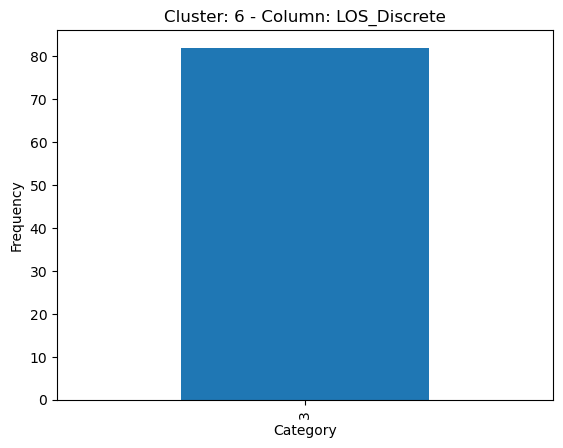

In [8]:
unique_labels = np.unique(labels)
for label in unique_labels:
    label_indices = labels == label  

    for column in data.columns:
        column_data = data[column][label_indices]  
        
        plt.figure()
        column_data.value_counts().plot(kind='bar')
        plt.title(f'Cluster: {label} - Column: {column}')
        plt.xlabel('Category')
        plt.ylabel('Frequency')
        filename = f'plots/cluster_{label}_column_{column}.png'
        plt.savefig(filename)
        plt.show()

In [7]:
dfs = []
for label in sorted(set(labels)):
    label_indices = labels == label
    
    frequency_info = {}

    for column in data.columns:
        column_data = data[column][label_indices] 
        most_frequent_value = column_data.mode().values[0]
        most_frequent_count = column_data.value_counts().max()

        frequency_info[f'Most frequent: {column}'] = most_frequent_value
        frequency_info[f'Its frequency: {column}'] = most_frequent_count
    
    frequency_info['FREQUENCY OF THE CLUSTER'] = len(column_data)

    df = pd.DataFrame(frequency_info, index=[f'Cluster {label}'])
    dfs.append(df)

result_table = pd.concat(dfs)

result_table = result_table.T
result_table.to_excel('analysis_results.xlsx')
result_table

,Cluster 0,Cluster 1,Cluster 2,Cluster 3,Cluster 4,Cluster 5,Cluster 6
Most frequent: Age_Group,30 to 49,50 to 69,70 or Older,50 to 69,70 or Older,70 or Older,50 to 69
Its frequency: Age_Group,4620,398,2374,122,3800,1174,42
Most frequent: Gender,F,M,M,M,F,M,M
Its frequency: Gender,10040,612,2784,168,5391,1430,51
Most frequent: Race,White,White,White,White,White,White,Other Race
Its frequency: Race,8304,504,2879,138,5645,1322,30
Most frequent: Type_Of_Admission,Emergency,Emergency,Emergency,Emergency,Emergency,Emergency,Emergency
Its frequency: Type_Of_Admission,6625,750,4510,241,8133,2099,62
Most frequent: Diagnosis_Description,LIVEBORN,SEPTICEMIA,SEPTICEMIA,SEPTICEMIA,SEPTICEMIA,SEPTICEMIA,SEPTICEMIA
Its frequency: Diagnosis_Description,2520,212,751,78,857,462,22
